<a href="https://colab.research.google.com/github/diegormsouza/Agrometeorology_Python_Oct_2021/blob/main/Curso_Agrometeorologia_Oct_2021.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Curso de Agrometeorología (25 de Octubre, 2021)** 

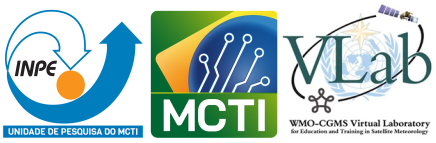

### **Contacto:** 

Diego Souza - INPE / CGCT / DISSM - (diego.souza@inpe.br)

Daniel Vila - INPE / CGCT / DISSM - (daniel.vila@inpe.br)

# Introducción

¡Bienvenido a la demonstración de scripts Python del **"Curso de Agrometeorologia"**! 


---


Este "notebook" interactivo contiene instrucciones para instalar las herramientas necesárias para el uso de scripts Python para manipulación de datos de agrometeorología. Todas las instrucciones y scripts se ejecutan en la nube y no es necesario instalar las herramientas y descargar archivos localmente. Para ejecutar las instrucciones, haga clic en el icono "Play" entre corchetes en el lado izquierdo de cada celda, secuencialmente.

# 1 ° Paso: Verificación de la Configuración de la Máquina Virtual

En este paso verificamos la configuración de la máquina virtual y la versión de Python instalada.


In [ ]:
# Sistema Operativo Instalado
!cat /etc/issue
!uname -a
print('\n')

# RAM Disponible
!grep MemTotal /proc/meminfo
print('\n')

# Espacio Disponible en Disco Duro
!df -h
print('\n')

# Directorio de Instalación Python
!which python
print('\n')

# Versión Python Instalada
!python --version
print('\n')

Ubuntu 18.04.5 LTS \n \l

Linux 26695ea8afb7 5.4.104+ #1 SMP Sat Jun 5 09:50:34 PDT 2021 x86_64 x86_64 x86_64 GNU/Linux


MemTotal:       13302924 kB


Filesystem      Size  Used Avail Use% Mounted on
overlay         108G   47G   62G  44% /
tmpfs            64M     0   64M   0% /dev
tmpfs           6.4G     0  6.4G   0% /sys/fs/cgroup
shm             5.9G     0  5.9G   0% /dev/shm
/dev/root       2.0G  1.2G  821M  59% /sbin/docker-init
tmpfs           6.4G   36K  6.4G   1% /var/colab
/dev/sda1        81G   51G   31G  63% /etc/hosts
tmpfs           6.4G     0  6.4G   0% /proc/acpi
tmpfs           6.4G     0  6.4G   0% /proc/scsi
tmpfs           6.4G     0  6.4G   0% /sys/firmware


/usr/local/bin/python


Python 3.7.12




# 2° Paso: Instalación de las Bibliotecas Python Necesarias

En este paso instalamos las bibliotecas necesarias para ejecutar los scripts. Básicamente, las bibliotecas tendrán el siguiente propósito:

*   **NetCDF4:** Leer archivos NetCDF
*   **Cartopy:** Agregar mapas a los plots

In [ ]:
# Instalación de la biblioteca NetCDF4
!pip install netcdf4
print('\n')

# Instalación de la biblioteca Cartopy
!pip install cartopy
!pip install shapely --no-binary shapely --force
print('\n')

# Descarga de los mapas estándar de Cartopy desde AWS
!wget https://raw.githubusercontent.com/SciTools/cartopy/master/tools/cartopy_feature_download.py
!python cartopy_feature_download.py physical
!python cartopy_feature_download.py cultural
!python cartopy_feature_download.py cultural-extra
print('\n')

# Instalando a Biblioteca Boto3
!pip install boto3
print('\n')

# Install ImageMagick
!sudo apt install imagemagick
print('\n')



     |████████████████████████████████| 10.8 MB 6.4 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 24.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 12.1 MB 166 kB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 219 kB 69.0 MB/s 
  Created wheel for cartopy: filename=Cartopy-0.19.0.post1-cp37-cp37m-linux_x86_64.whl size=12516268 sha256=31aa786645893c0d9d26c92c855bb0d6e6f3d912f7659177604d3e44ae48b194
  Stored in directory: /root/.cache/pip/wheels/98/01/f7/bd10aeb96fe4b518cde5f7c4f5e12c7202f85b7353a5017847
  Created wheel for pyshp: filename=pyshp-2.1.3-py3-none-any.whl size=37325 sha256=74bffaf69f8693d37bfbc238269c707333df30d3351ef91e2b586257cfc234e5
  Stored in directory: /root/.cac

# 3° Paso: Descarga de Muestras y Archivos Auxiliares

En este paso descargaremos algunas muestras de datos y archivos auxiliares, necesarios para esta demostración:

Muestras de datos:
*   **IMERG_spi_gamma_03.nc:** Índice de Precipitación Estandarizado (SPI) 

Archivos auxiliares:
*   **ne_10m_admin_1_states_provinces.shp:** Shapefile con estados y provincias del mundo


In [ ]:
# Download a shapefile (world states and provinces)
!wget -c https://github.com/nvkelso/natural-earth-vector/raw/master/10m_cultural/ne_10m_admin_1_states_provinces.shp
!wget -c https://github.com/nvkelso/natural-earth-vector/raw/master/10m_cultural/ne_10m_admin_1_states_provinces.shx
!wget -c https://github.com/nvkelso/natural-earth-vector/raw/master/10m_cultural/ne_10m_admin_1_states_provinces.dbf
print('\n')

# Download do script "utilities.py", do curso de processamento de satélites, com algumas funções que facilitam a manipulação de dados de satélite
!wget -c https://www.dropbox.com/s/i8j1g9xg1g7o56l/utilities.py
print('\n')

# Downloading the SPI sample file
!wget -c https://www.dropbox.com/s/c9bp8ruj582vbsz/IMERG_spi_gamma_03.nc
!wget -c https://www.dropbox.com/s/wf588k1rwldz8au/IMERG_spi_gamma_06.nc
!wget -c https://www.dropbox.com/s/8a6sny6f59mwefi/IMERG_spi_gamma_12.nc
print('\n')

# Downloading GOES-16 sample files for the NDVI
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/196/18/OR_ABI-L2-CMIPF-M6C02_G16_s20211961800226_e20211961809534_c20211961810005.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/196/18/OR_ABI-L2-CMIPF-M6C03_G16_s20211961800226_e20211961809534_c20211961810014.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/197/18/OR_ABI-L2-CMIPF-M6C02_G16_s20211971800227_e20211971809535_c20211971810003.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/197/18/OR_ABI-L2-CMIPF-M6C03_G16_s20211971800227_e20211971809535_c20211971810005.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/198/18/OR_ABI-L2-CMIPF-M6C02_G16_s20211981800227_e20211981809535_c20211981810004.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/198/18/OR_ABI-L2-CMIPF-M6C03_G16_s20211981800227_e20211981809535_c20211981810005.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/199/18/OR_ABI-L2-CMIPF-M6C02_G16_s20211991800228_e20211991809536_c20211991810003.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/199/18/OR_ABI-L2-CMIPF-M6C03_G16_s20211991800228_e20211991809536_c20211991810007.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/200/18/OR_ABI-L2-CMIPF-M6C02_G16_s20212001800229_e20212001809537_c20212001810010.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/200/18/OR_ABI-L2-CMIPF-M6C03_G16_s20212001800229_e20212001809537_c20212001810007.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/201/18/OR_ABI-L2-CMIPF-M6C02_G16_s20212011800229_e20212011809537_c20212011810002.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/201/18/OR_ABI-L2-CMIPF-M6C03_G16_s20212011800229_e20212011809537_c20212011810012.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/202/18/OR_ABI-L2-CMIPF-M6C02_G16_s20212021800230_e20212021809538_c20212021814443.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/202/18/OR_ABI-L2-CMIPF-M6C03_G16_s20212021800230_e20212021809538_c20212021814438.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/203/18/OR_ABI-L2-CMIPF-M6C02_G16_s20212031800230_e20212031809538_c20212031810013.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/203/18/OR_ABI-L2-CMIPF-M6C03_G16_s20212031800230_e20212031809538_c20212031810017.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/204/18/OR_ABI-L2-CMIPF-M6C02_G16_s20212041800231_e20212041809539_c20212041810006.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/204/18/OR_ABI-L2-CMIPF-M6C03_G16_s20212041800231_e20212041809539_c20212041810005.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/205/18/OR_ABI-L2-CMIPF-M6C02_G16_s20212051800222_e20212051809530_c20212051810002.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/205/18/OR_ABI-L2-CMIPF-M6C03_G16_s20212051800222_e20212051809530_c20212051810006.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/206/18/OR_ABI-L2-CMIPF-M6C02_G16_s20212061800223_e20212061809530_c20212061810008.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/206/18/OR_ABI-L2-CMIPF-M6C03_G16_s20212061800223_e20212061809531_c20212061810007.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/207/18/OR_ABI-L2-CMIPF-M6C02_G16_s20212071800223_e20212071809531_c20212071810003.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/207/18/OR_ABI-L2-CMIPF-M6C03_G16_s20212071800223_e20212071809531_c20212071809596.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/208/18/OR_ABI-L2-CMIPF-M6C02_G16_s20212081800223_e20212081809531_c20212081810001.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/208/18/OR_ABI-L2-CMIPF-M6C03_G16_s20212081800223_e20212081809531_c20212081810010.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/209/18/OR_ABI-L2-CMIPF-M6C02_G16_s20212091800224_e20212091809532_c20212091810006.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/209/18/OR_ABI-L2-CMIPF-M6C03_G16_s20212091800224_e20212091809532_c20212091810004.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/210/18/OR_ABI-L2-CMIPF-M6C02_G16_s20212101800224_e20212101809532_c20212101810000.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/210/18/OR_ABI-L2-CMIPF-M6C03_G16_s20212101800224_e20212101809532_c20212101810006.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/211/18/OR_ABI-L2-CMIPF-M6C02_G16_s20212111800224_e20212111809532_c20212111810005.nc -P /content/Samples/
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2021/211/18/OR_ABI-L2-CMIPF-M6C03_G16_s20212111800224_e20212111809532_c20212111809597.nc -P /content/Samples/
print('\n')

--2021-10-29 15:05:50--  https://github.com/nvkelso/natural-earth-vector/raw/master/10m_cultural/ne_10m_admin_1_states_provinces.shp
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/10m_cultural/ne_10m_admin_1_states_provinces.shp [following]
--2021-10-29 15:05:51--  https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/10m_cultural/ne_10m_admin_1_states_provinces.shp
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20998708 (20M) [application/octet-stream]
Saving to: ‘ne_10m_admin_1_states_provinces.shp’

ne_10m_admin_1_stat 100%[===============

# Demonstración 1: Índice de Precipitación Estandarizado (SPI)

En este ejemplo vamos a procesar un archivo NetCDF con datos de SPI. Podemos elegir el mes deseado en la variable "month".

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: UserWarning: WARNING: valid_min not used since it
cannot be safely cast to variable data type
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: UserWarning: WARNING: valid_max not used since it
cannot be safely cast to variable data type
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: WARNING: valid_min not used since it
cannot be safely cast to variable data type
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: WARNING: valid_max not used since it
cannot be safely cast to variable data type


Found! The desired index is:  239


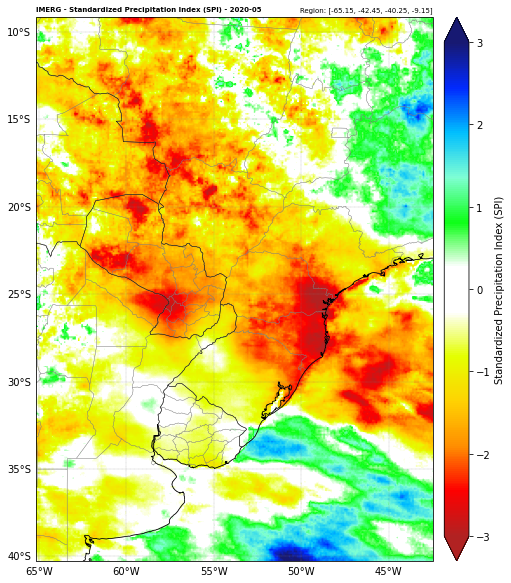

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Agrometeorology Course - Demonstration 1: Standardized Precipitation Index (SPI)
# Author: Diego Souza (INPE)
#-----------------------------------------------------------------------------------------------------------

# Required modules
from netCDF4 import Dataset                 # Read / Write NetCDF4 files
import matplotlib.pyplot as plt             # Plotting library
import cartopy, cartopy.crs as ccrs         # Plot maps
import cartopy.io.shapereader as shpreader  # Import shapefiles
import numpy as np                          # Import the Numpy package
from datetime import datetime, timedelta    # Library to convert julian day to dd-mm-yyyy
import matplotlib.colors                    # Matplotlib colors

#------------------------------------------------------------------------------------------------------
###################
# READING THE DATA
###################

# Choose the desired year and month ('YYYY-MM')
month = '2020-05'

# Open the file using the NetCDF4 library
file = Dataset("IMERG_spi_gamma_12.nc")
                                  
# Checking how many time indexes the data has
indexes = file.variables['spi_gamma_12'][:].shape[2]

# Initialize the index variable
index = -1

# Loop through all the time indexes and check which one matches the desired date
for x in range(indexes):
  add_seconds = int(file.variables['time'][x])
  date = datetime(1970,1,1,00) + timedelta(seconds=add_seconds)
  date_formatted = date.strftime('%Y-%m')
  if (date_formatted == month):
    print("Found! The desired index is: ", x)
    index = x
    break

# If the desired data is not found, exit the script
if (index == -1):
  print('No datasets found for the month ' + month + '. Exiting script.')
  quit() 

# Extract the SPI only for the desired date
data = file.variables['spi_gamma_12'][:,:,index]

#------------------------------------------------------------------------------------------------------
####################
# PLOTTING THE DATA
####################

# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Use the Cylindrical Equidistant projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Read the minimum and maximum file coordinates
min_lon = file.variables['lon'][:].min()
max_lon = file.variables['lon'][:].max()
min_lat = file.variables['lat'][:].min()
max_lat = file.variables['lat'][:].max()

# Define the image extent
img_extent = [min_lon, max_lon, min_lat, max_lat]

# Create a custom color scale
# Reference color pallete: #https://www.ncdc.noaa.gov/monitoring-content/sotc/drought/2020/08/noaa-wrcc-spi-us-aug20-03m.png
colors = ["#b12222", "#fe0000", "#ff8e01", "#ffd202", "#e4ff00", "#ffffff", 
          "#ffffff", "#0cff16", "#80ffd4", "#00bffe", "#012afe", "#171972"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
cmap.set_over('#171972')
cmap.set_under('#b12222')
vmin = -3.0
vmax = 3.0

# Plot the image
img = ax.imshow(data, vmin=vmin, vmax=vmax, origin='lower', extent=img_extent, cmap=cmap)

# Add a shapefile
shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='black', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='gray', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 5), ylocs=np.arange(-90, 90, 5), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Add a colorbar
plt.colorbar(img, label='Standardized Precipitation Index (SPI)', extend='both', orientation='vertical', pad=0.02, fraction=0.05)

# Add a title
plt.title('IMERG - Standardized Precipitation Index (SPI) - ' + month, fontweight='bold', fontsize=7, loc='left')
plt.title('Region: ' + str(img_extent), fontsize=7, loc='right')

#------------------------------------------------------------------------------------------------------

# Show the image
plt.show()

# Demonstración 2: Índice de Vegetación de Diferencia Normalizada (NDVI) - Archivos Locales

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:385: ShapelyDeprecationWarning: Iteration over multi-pa

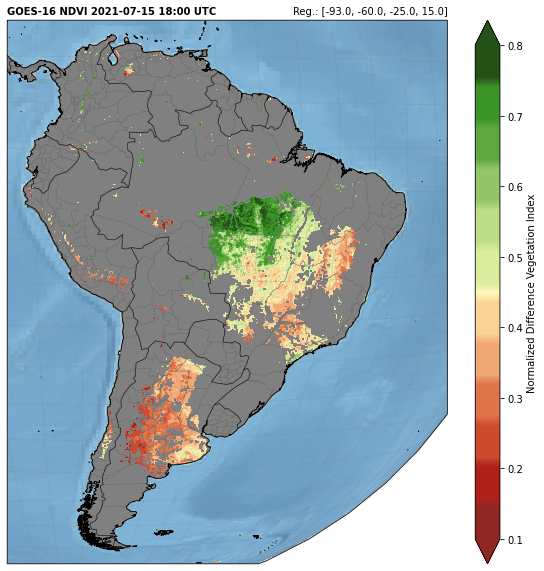

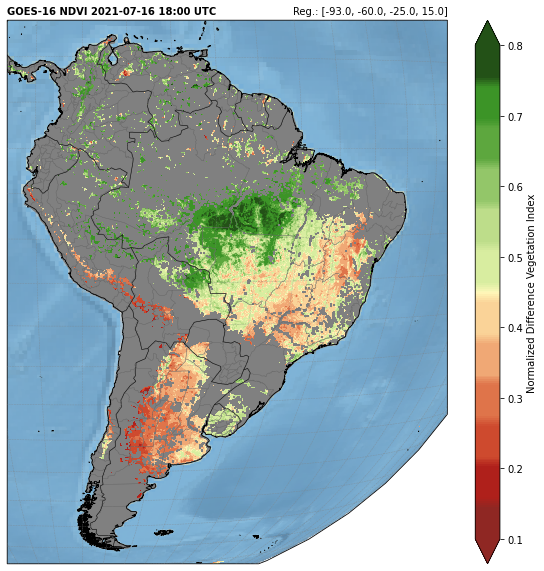

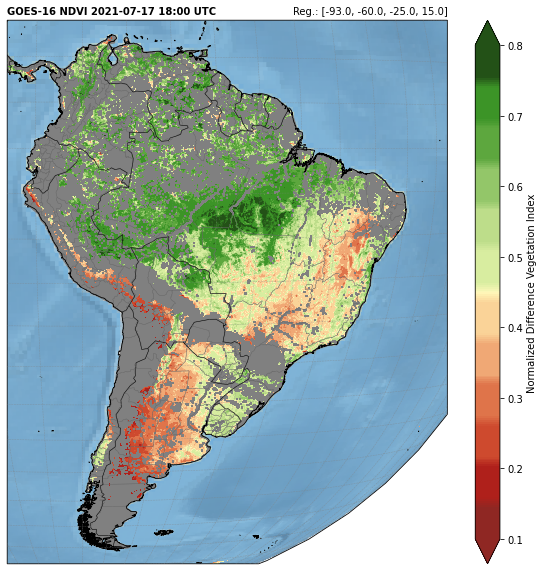

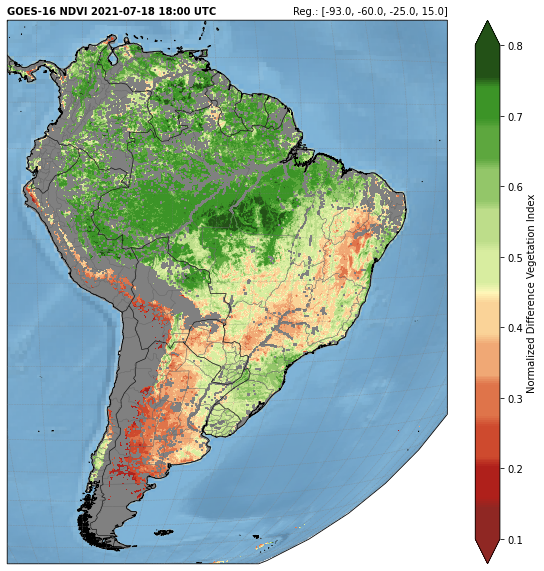

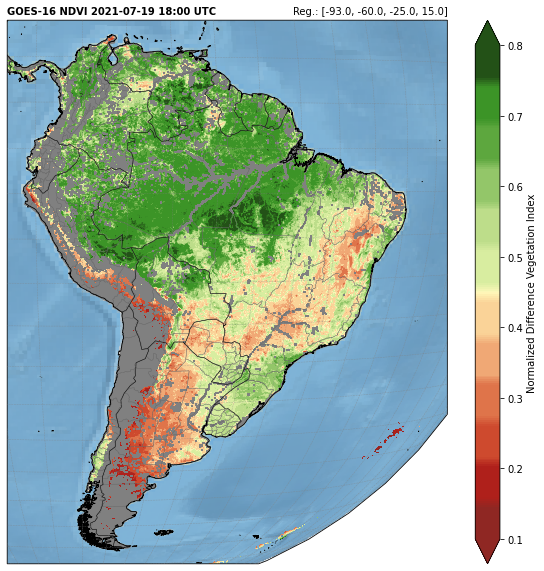

...

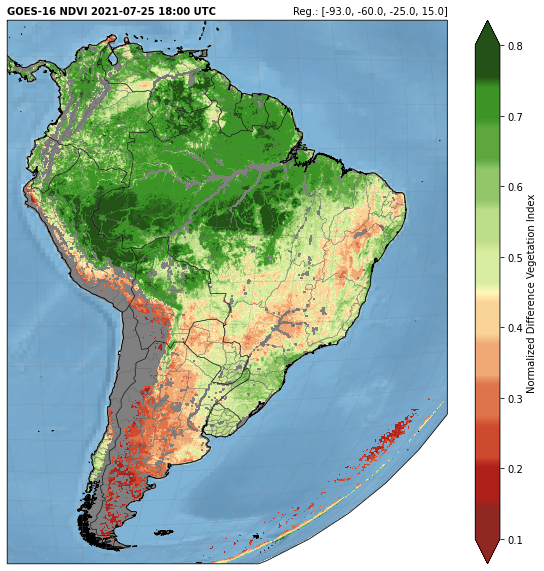

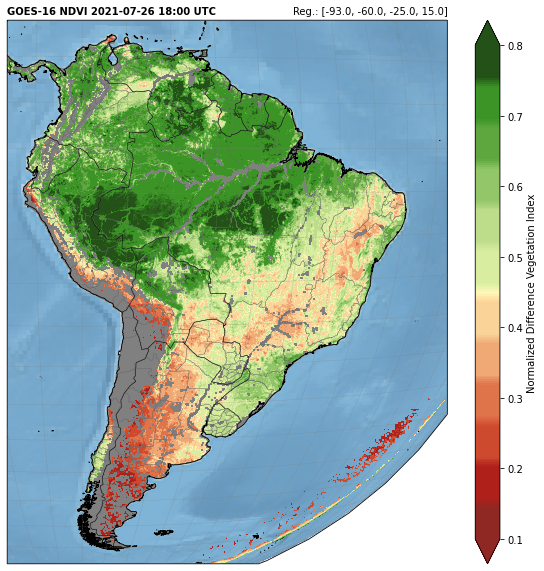

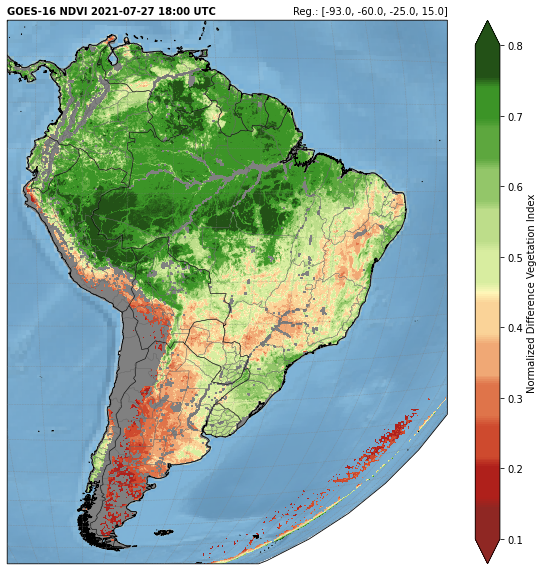

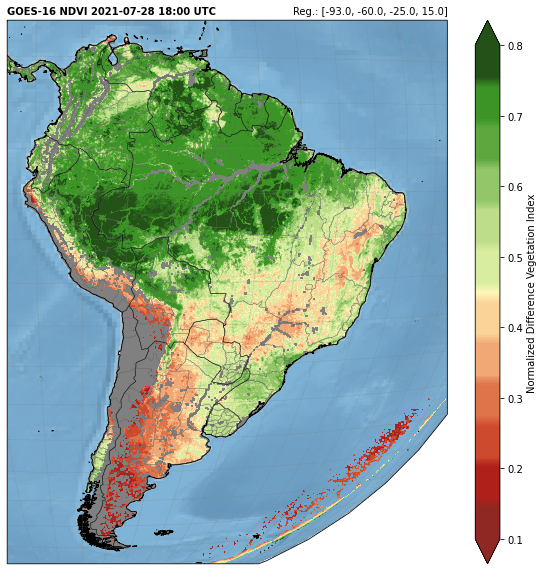

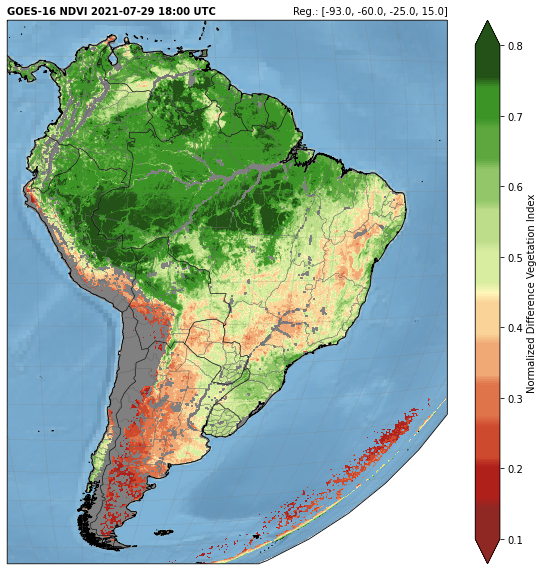

KeyboardInterrupt: ignored

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7f8bb1a3fcb0> (for post_execute):


KeyboardInterrupt: ignored

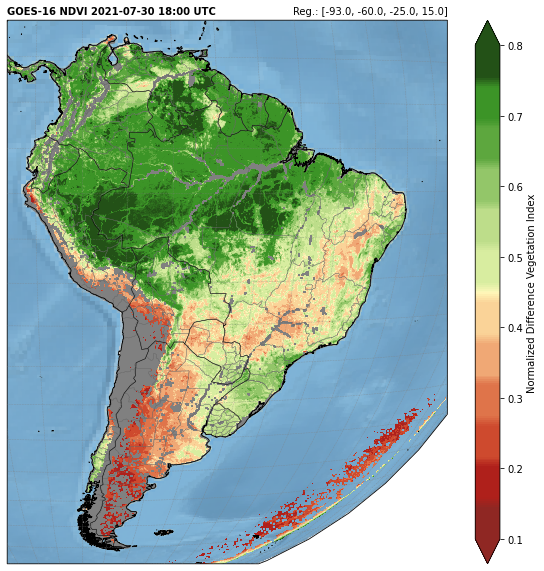

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Agrometeorology Course - Demonstration 2: Normalized Difference Vegetation Index (NDVI)
# Author: Diego Souza
#-----------------------------------------------------------------------------------------------------------
# Required modules
from netCDF4 import Dataset                    # Read / Write NetCDF4 files
import matplotlib.pyplot as plt                # Plotting library
from datetime import datetime                  # Basic Dates and time types
from datetime import timedelta, date, datetime # Basic Dates and time types
import cartopy, cartopy.crs as ccrs            # Plot maps
import cartopy.io.shapereader as shpreader     # Import shapefiles
import numpy as np                             # Scientific computing with Python
import os                                      # Miscellaneous operating system interfaces
from utilities import download_CMI             # Our own utilities
from utilities import geo2grid, latlon2xy, convertExtent2GOESProjection      # Our own utilities
#-----------------------------------------------------------------------------------------------------------
# Input and output directories
input = "/content/Samples"; os.makedirs(input, exist_ok=True)
output = "/content/Animation"; os.makedirs(output, exist_ok=True)

# Desired extent
extent = [-93.0, -60.00, -25.00, 15.00] # Min lon, Min lat, Max lon, Max lat

# List of files for Band 02
files_ch02 = ['OR_ABI-L2-CMIPF-M6C02_G16_s20211961800226_e20211961809534_c20211961810005.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20211971800227_e20211971809535_c20211971810003.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20211981800227_e20211981809535_c20211981810004.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20211991800228_e20211991809536_c20211991810003.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20212001800229_e20212001809537_c20212001810010.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20212011800229_e20212011809537_c20212011810002.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20212021800230_e20212021809538_c20212021814443.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20212031800230_e20212031809538_c20212031810013.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20212041800231_e20212041809539_c20212041810006.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20212051800222_e20212051809530_c20212051810002.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20212061800223_e20212061809530_c20212061810008.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20212071800223_e20212071809531_c20212071810003.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20212081800223_e20212081809531_c20212081810001.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20212091800224_e20212091809532_c20212091810006.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20212101800224_e20212101809532_c20212101810000.nc',
 'OR_ABI-L2-CMIPF-M6C02_G16_s20212111800224_e20212111809532_c20212111810005.nc',
]

# List of files for Band 03
files_ch03 = ['OR_ABI-L2-CMIPF-M6C03_G16_s20211961800226_e20211961809534_c20211961810014.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20211971800227_e20211971809535_c20211971810005.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20211981800227_e20211981809535_c20211981810005.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20211991800228_e20211991809536_c20211991810007.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20212001800229_e20212001809537_c20212001810007.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20212011800229_e20212011809537_c20212011810012.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20212021800230_e20212021809538_c20212021814438.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20212031800230_e20212031809538_c20212031810017.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20212041800231_e20212041809539_c20212041810005.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20212051800222_e20212051809530_c20212051810006.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20212061800223_e20212061809531_c20212061810007.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20212071800223_e20212071809531_c20212071809596.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20212081800223_e20212081809531_c20212081810010.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20212091800224_e20212091809532_c20212091810004.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20212101800224_e20212101809532_c20212101810006.nc',
 'OR_ABI-L2-CMIPF-M6C03_G16_s20212111800224_e20212111809532_c20212111809597.nc',
]
#-----------------------------------------------------------------------------------------------------------
# NDVI colormap creation 
import matplotlib
colors = ["#8f2723", "#8f2723", "#8f2723", "#8f2723", "#af201b", "#af201b", "#af201b", "#af201b", "#ce4a2e", "#ce4a2e", "#ce4a2e", "#ce4a2e", 
          "#df744a", "#df744a", "#df744a", "#df744a", "#f0a875", "#f0a875", "#f0a875", "#f0a875", "#fad398", "#fad398", "#fad398", "#fad398",
          "#fff8ba",
          "#d8eda0", "#d8eda0", "#d8eda0", "#d8eda0", "#bddd8a", "#bddd8a", "#bddd8a", "#bddd8a", "#93c669", "#93c669", "#93c669", "#93c669", 
          "#5da73e", "#5da73e", "#5da73e", "#5da73e", "#3c9427", "#3c9427", "#3c9427", "#3c9427", "#235117", "#235117", "#235117", "#235117"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
cmap.set_over('#235117')
cmap.set_under('#8f2723')
vmin = 0.1
vmax = 0.8
#-----------------------------------------------------------------------------------------------------------

# Variable to check if is the first iteration
first = True

for x in range(len(files_ch02)):
   
    #-----------------------------------------------------------------------------------------------------------
    
    # Open the GOES-R image (Band 02)
    file = Dataset(f'{input}/{files_ch02[x]}')
                      
    # Convert lat/lon to grid-coordinates
    lly, llx = geo2grid(extent[1], extent[0], file)
    ury, urx = geo2grid(extent[3], extent[2], file)
            
    # Get the pixel values
    data_ch02 = file.variables['CMI'][ury:lly, llx:urx][::2 ,::2]   
    
    #-----------------------------------------------------------------------------------------------------------
    
    # Open the GOES-R image (Band 03)
    file = Dataset(f'{input}/{files_ch03[x]}')
                      
    # Convert lat/lon to grid-coordinates
    lly, llx = geo2grid(extent[1], extent[0], file)
    ury, urx = geo2grid(extent[3], extent[2], file)
            
    # Get the pixel values
    data_ch03 = file.variables['CMI'][ury:lly, llx:urx]      
    
    #-----------------------------------------------------------------------------------------------------------
    
    # Make the arrays equal size
    cordX = np.shape(data_ch02)[0], np.shape(data_ch03)[0]
    cordY = np.shape(data_ch02)[1], np.shape(data_ch03)[1]

    minvalX = np.array(cordX).min()
    minvalY = np.array(cordY).min()

    data_ch02 = data_ch02[0:minvalX, 0:minvalY]
    data_ch03 = data_ch03[0:minvalX, 0:minvalY]
    
    #-----------------------------------------------------------------------------------------------------------
    
    # Calculate the NDVI
    data = (data_ch03 - data_ch02) / (data_ch03 + data_ch02)
    
    #-----------------------------------------------------------------------------------------------------------
    
    # Compute data-extent in GOES projection-coordinates
    img_extent = convertExtent2GOESProjection(extent)
    
    #-----------------------------------------------------------------------------------------------------------
    
    # If it's the first iteration, create the array that will store the max values
    if (first == True):
      first = False
      ndvi_max = np.full((data_ch02.shape[0],data_ch02.shape[1]),-9999)
    
    # Keep the maximuns, ignoring the nans
    ndvi_max = np.fmax(data,ndvi_max)
    # Remove low values from the accumulation
    ndvi_max[ndvi_max < 0.1] = np.nan
    
    # Choose the plot size (width x height, in inches)
    plt.figure(figsize=(10,10))

    # Use the Geostationary projection in cartopy
    ax = plt.axes(projection=ccrs.Geostationary(central_longitude=-75.0, satellite_height=35786023.0))
   
    # Add a land mask
    ax.stock_img()       
    import cartopy.feature as cfeature
    land = ax.add_feature(cfeature.LAND, facecolor='gray', zorder=1)
  
    # Plot the image
    img = ax.imshow(ndvi_max, origin='upper', vmin=vmin, vmax=vmax, extent=img_extent, cmap=cmap, zorder=2)

    # Add an ocean mask
    #ocean = ax.add_feature(cfeature.OCEAN, facecolor='lightsteelblue', zorder=3)

    # Add a shapefile
    shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
    ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='dimgray',facecolor='none', linewidth=0.3, zorder=4)

    # Add coastlines, borders and gridlines
    ax.coastlines(resolution='10m', color='black', linewidth=0.8, zorder=5)
    ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5, zorder=6)
    ax.gridlines(color='gray', alpha=0.5, linestyle='--', linewidth=0.5, xlocs=np.arange(-180, 180, 5), ylocs=np.arange(-90, 90, 5), zorder=7)

    # Add a colorbar
    plt.colorbar(img, label='Normalized Difference Vegetation Index', extend='both', orientation='vertical', pad=0.05, fraction=0.05)

    # Extract date
    date = (datetime.strptime(file.time_coverage_start, '%Y-%m-%dT%H:%M:%S.%fZ'))

    # Add a title
    plt.title('GOES-16 NDVI ' + date.strftime('%Y-%m-%d %H:%M') + ' UTC', fontweight='bold', fontsize=10, loc='left')
    plt.title('Reg.: ' + str(extent) , fontsize=10, loc='right')
    #-----------------------------------------------------------------------------------------------------------
    # Save the image
    plt.savefig(f'{output}/G16_NDVI_{yyyymmddhhmn}.png', bbox_inches='tight', pad_inches=0, dpi=100)

    # Show the image
    plt.show()

# Demonstración 3: Índice de Vegetación de Diferencia Normalizada (NDVI) - Seleccionando Intervalos y Bajando Datos

202010131800


/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:385: ShapelyDeprecationWarning: Iteration over multi-pa

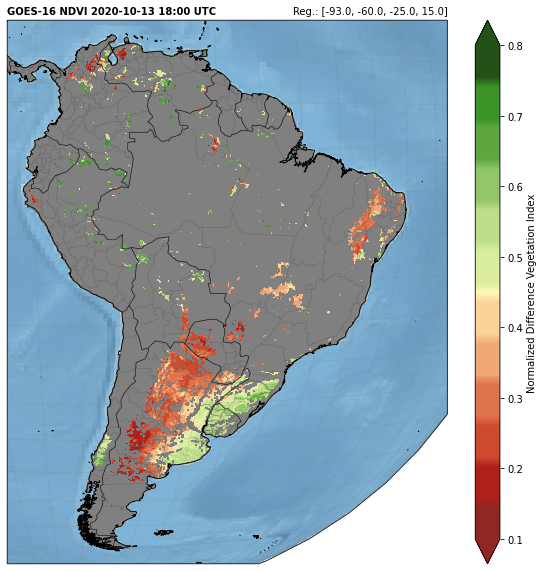

202010141800


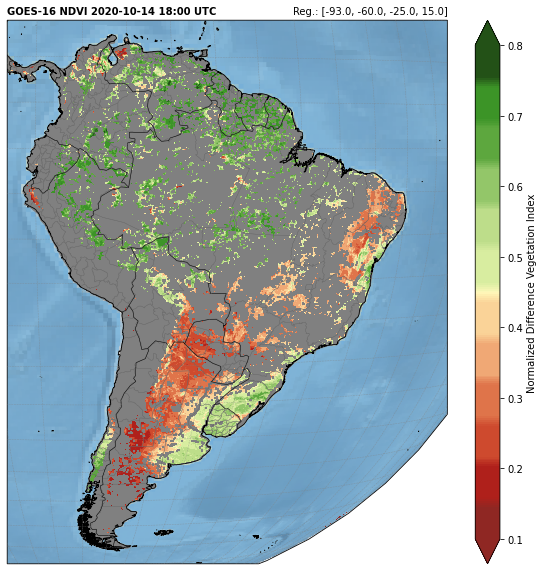

202010151800


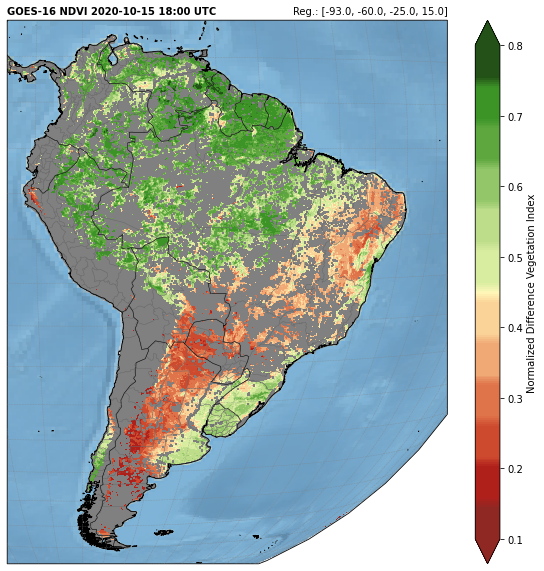

202010161800


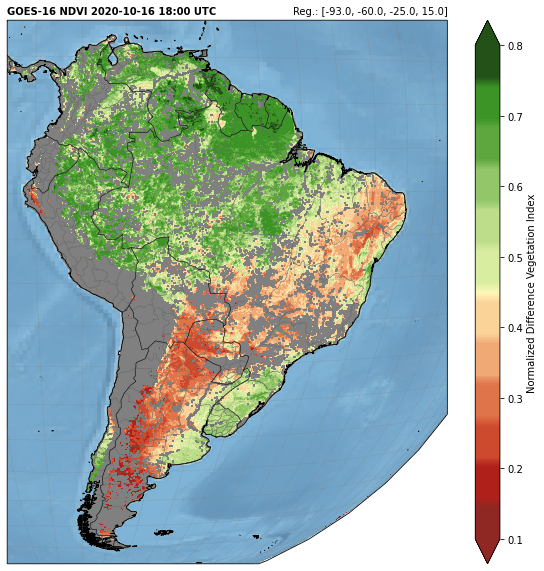

202010171800


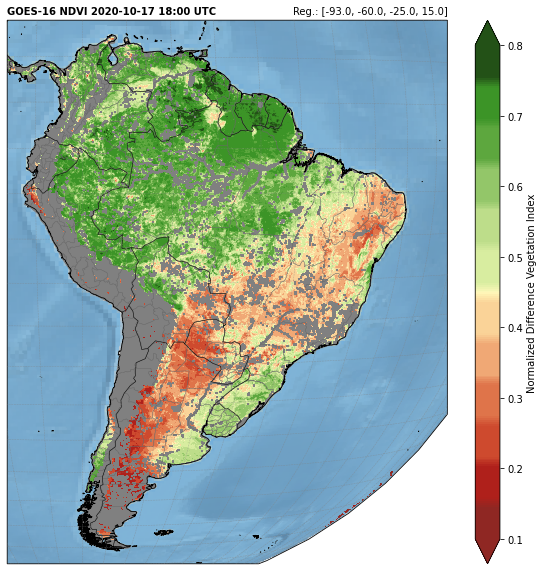

202010181800


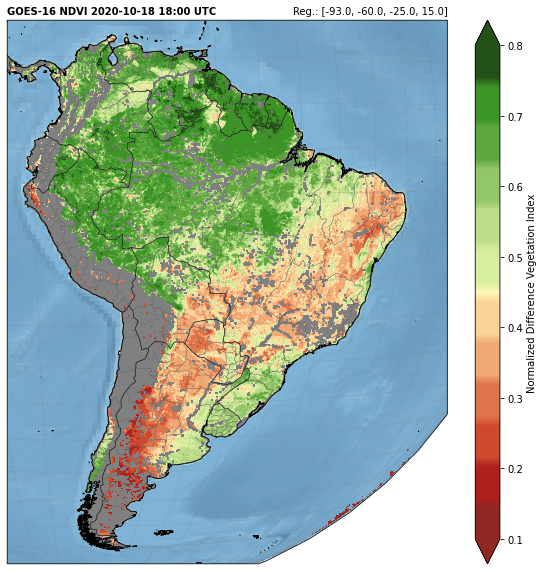

202010191800


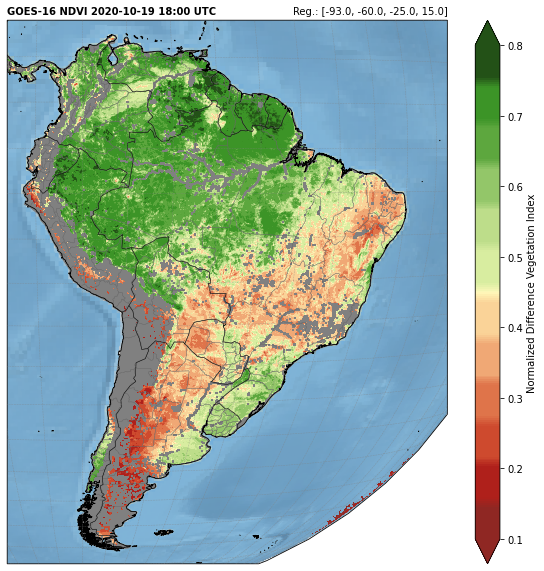

202010201800


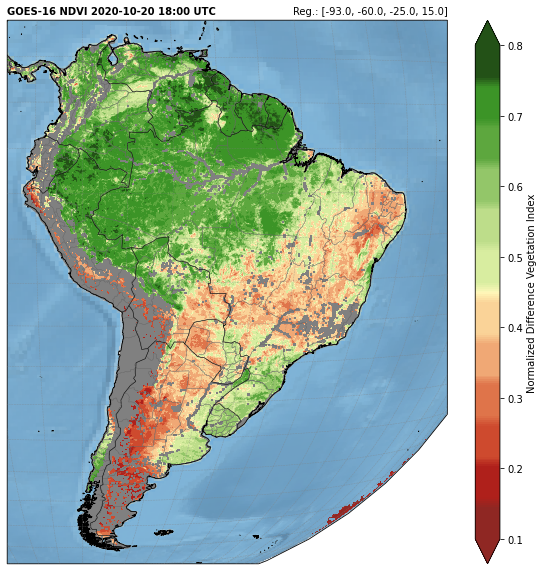

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Agrometeorology Course - Demonstration 3: Normalized Difference Vegetation Index (NDVI)
# Author: Diego Souza
#-----------------------------------------------------------------------------------------------------------
# Required modules
from netCDF4 import Dataset                    # Read / Write NetCDF4 files
import matplotlib.pyplot as plt                # Plotting library
from datetime import datetime                  # Basic Dates and time types
from datetime import timedelta, date, datetime # Basic Dates and time types
import cartopy, cartopy.crs as ccrs            # Plot maps
import cartopy.io.shapereader as shpreader     # Import shapefiles
import numpy as np                             # Scientific computing with Python
import os                                      # Miscellaneous operating system interfaces
from utilities import download_CMI             # Our own utilities
from utilities import geo2grid, latlon2xy, convertExtent2GOESProjection      # Our own utilities
#-----------------------------------------------------------------------------------------------------------
# Input and output directories
input = "/content/Samples"; os.makedirs(input, exist_ok=True)
output = "/content/Animation"; os.makedirs(output, exist_ok=True)

# Desired extent
extent = [-93.0, -60.00, -25.00, 15.00] # Min lon, Min lat, Max lon, Max lat

# Initial date and time to process
yyyymmddhhmn = '202010131800'

# Number of days to accumulate
ndays = 7

# Initial time and date
yyyy = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%Y')
mm = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%m')
dd = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%d')
hh = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%H')
mn = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%M')
date_ini = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)))

# Choose number of days ahead
date_end = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)) + timedelta(days=ndays))

#-----------------------------------------------------------------------------------------------------------
# NDVI colormap creation 
import matplotlib
colors = ["#8f2723", "#8f2723", "#8f2723", "#8f2723", "#af201b", "#af201b", "#af201b", "#af201b", "#ce4a2e", "#ce4a2e", "#ce4a2e", "#ce4a2e", 
          "#df744a", "#df744a", "#df744a", "#df744a", "#f0a875", "#f0a875", "#f0a875", "#f0a875", "#fad398", "#fad398", "#fad398", "#fad398",
          "#fff8ba",
          "#d8eda0", "#d8eda0", "#d8eda0", "#d8eda0", "#bddd8a", "#bddd8a", "#bddd8a", "#bddd8a", "#93c669", "#93c669", "#93c669", "#93c669", 
          "#5da73e", "#5da73e", "#5da73e", "#5da73e", "#3c9427", "#3c9427", "#3c9427", "#3c9427", "#235117", "#235117", "#235117", "#235117"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
cmap.set_over('#235117')
cmap.set_under('#8f2723')
vmin = 0.1
vmax = 0.8
#-----------------------------------------------------------------------------------------------------------

# Variable to check if is the first iteration
first = True

while (date_ini <= date_end):

    # Date structure
    yyyymmddhhmn = datetime.strptime(date_ini, '%Y-%m-%d %H:%M:%S').strftime('%Y%m%d%H%M')
    print(yyyymmddhhmn)

    # Download the file for Band 02
    file_name_ch02 = download_CMI(yyyymmddhhmn, '2', input)

    # Download the file for Band 03
    file_name_ch03 = download_CMI(yyyymmddhhmn, '3', input)
    
    #-----------------------------------------------------------------------------------------------------------
    
    # If one the files hasn't been downloaded for some reason, skip the current iteration
    if not (os.path.exists(f'{input}/{file_name_ch02}.nc')) or not (os.path.exists(f'{input}/{file_name_ch03}.nc')):
      # Increment the date_ini
      date_ini = str(datetime.strptime(date_ini, '%Y-%m-%d %H:%M:%S') + timedelta(days=1))
      print("The file is not available, skipping this iteration.")
      continue

    # Open the GOES-R image (Band 02)
    file = Dataset(f'{input}/{file_name_ch02}.nc')
                      
    # Convert lat/lon to grid-coordinates
    lly, llx = geo2grid(extent[1], extent[0], file)
    ury, urx = geo2grid(extent[3], extent[2], file)
            
    # Get the pixel values
    data_ch02 = file.variables['CMI'][ury:lly, llx:urx][::2 ,::2]   
    
    #-----------------------------------------------------------------------------------------------------------
    
    # Open the GOES-R image (Band 03)
    file = Dataset(f'{input}/{file_name_ch03}.nc')
                      
    # Convert lat/lon to grid-coordinates
    lly, llx = geo2grid(extent[1], extent[0], file)
    ury, urx = geo2grid(extent[3], extent[2], file)
            
    # Get the pixel values
    data_ch03 = file.variables['CMI'][ury:lly, llx:urx]      
    
    #-----------------------------------------------------------------------------------------------------------
    
    # Make the arrays equal size
    cordX = np.shape(data_ch02)[0], np.shape(data_ch03)[0]
    cordY = np.shape(data_ch02)[1], np.shape(data_ch03)[1]

    minvalX = np.array(cordX).min()
    minvalY = np.array(cordY).min()

    data_ch02 = data_ch02[0:minvalX, 0:minvalY]
    data_ch03 = data_ch03[0:minvalX, 0:minvalY]
    
    #-----------------------------------------------------------------------------------------------------------
    
    # Calculate the NDVI
    data = (data_ch03 - data_ch02) / (data_ch03 + data_ch02)
    
    #-----------------------------------------------------------------------------------------------------------
    
    # Compute data-extent in GOES projection-coordinates
    img_extent = convertExtent2GOESProjection(extent)
    
    #-----------------------------------------------------------------------------------------------------------
    
    # If it's the first iteration, create the array that will store the max values
    if (first == True):
      first = False
      ndvi_max = np.full((data_ch02.shape[0],data_ch02.shape[1]),-9999)
    
    # Keep the maximuns, ignoring the nans
    ndvi_max = np.fmax(data,ndvi_max)
    # Remove low values from the accumulation
    ndvi_max[ndvi_max < 0.1] = np.nan
    
    # Choose the plot size (width x height, in inches)
    plt.figure(figsize=(10,10))

    # Use the Geostationary projection in cartopy
    ax = plt.axes(projection=ccrs.Geostationary(central_longitude=-75.0, satellite_height=35786023.0))
   
    # Add a land mask
    ax.stock_img()       
    import cartopy.feature as cfeature
    land = ax.add_feature(cfeature.LAND, facecolor='gray', zorder=1)
  
    # Plot the image
    img = ax.imshow(ndvi_max, origin='upper', vmin=vmin, vmax=vmax, extent=img_extent, cmap=cmap, zorder=2)

    # Add an ocean mask
    #ocean = ax.add_feature(cfeature.OCEAN, facecolor='lightsteelblue', zorder=3)

    # Add a shapefile
    shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
    ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='dimgray',facecolor='none', linewidth=0.3, zorder=4)

    # Add coastlines, borders and gridlines
    ax.coastlines(resolution='10m', color='black', linewidth=0.8, zorder=5)
    ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5, zorder=6)
    ax.gridlines(color='gray', alpha=0.5, linestyle='--', linewidth=0.5, xlocs=np.arange(-180, 180, 5), ylocs=np.arange(-90, 90, 5), zorder=7)

    # Add a colorbar
    plt.colorbar(img, label='Normalized Difference Vegetation Index', extend='both', orientation='vertical', pad=0.05, fraction=0.05)

    # Extract date
    date = (datetime.strptime(file.time_coverage_start, '%Y-%m-%dT%H:%M:%S.%fZ'))

    # Add a title
    plt.title('GOES-16 NDVI ' + date.strftime('%Y-%m-%d %H:%M') + ' UTC', fontweight='bold', fontsize=10, loc='left')
    plt.title('Reg.: ' + str(extent) , fontsize=10, loc='right')
    #-----------------------------------------------------------------------------------------------------------
    # Save the image
    plt.savefig(f'{output}/G16_NDVI_{yyyymmddhhmn}.png', bbox_inches='tight', pad_inches=0, dpi=100)

    # Show the image
    plt.show()

    # Increment the date_ini
    date_ini = str(datetime.strptime(date_ini, '%Y-%m-%d %H:%M:%S') + timedelta(days=1))

# Demonstración 4: Creando una Animación


Opening the GIF..



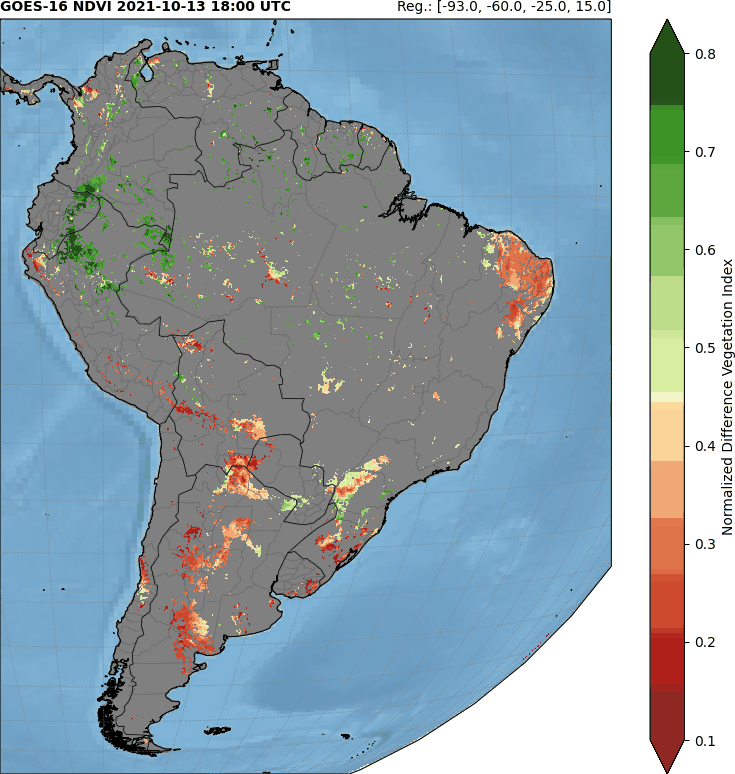

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Agrometeorology Course - Demonstration 4: Normalized Difference Vegetation Index (NDVI)
# Author: Diego Souza
#-----------------------------------------------------------------------------------------------------------
import imageio        # Python interface to read and write a wide range of image data
import glob           # Unix style pathname pattern expansion

# Images we want to include in the GIF
files = glob.glob('/content/Animation/G16_NDVI_202110*.png')
files.sort(key=os.path.getmtime)

# Create the GIF
images = []
for file in files:
    images.append(imageio.imread(file))
imageio.mimsave('animation.gif', images, fps=1)

# Open the GIF
print("\nOpening the GIF..\n")
from IPython.display import Image
Image(open('animation.gif','rb').read())

# Demonstración 5: Temperatura de la Superficie Terrestre (LST)

202107151800


/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:385: ShapelyDeprecationWarning: Iteration over multi-pa

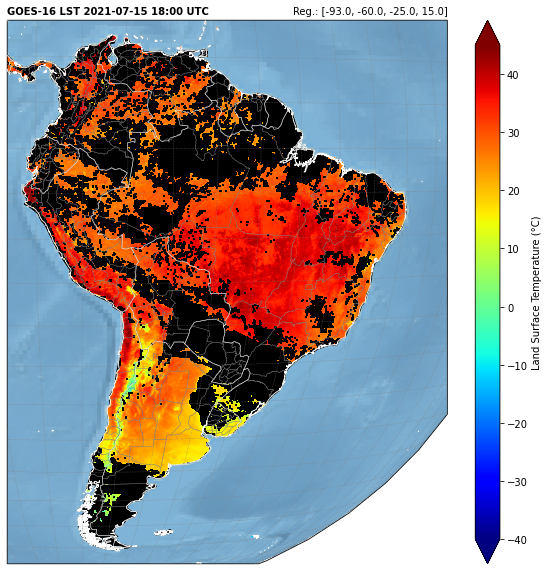

202107161800


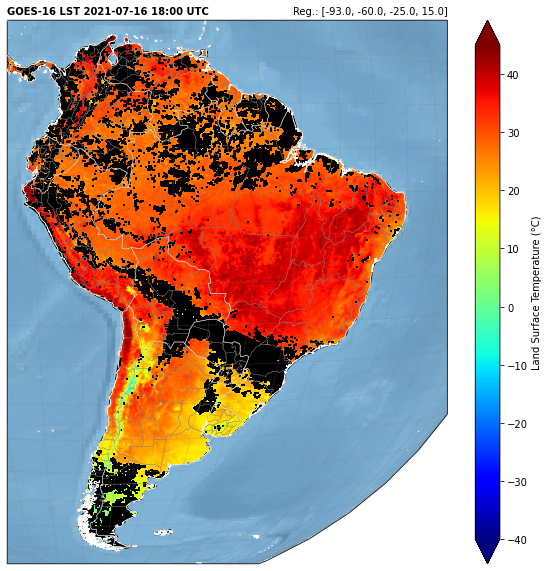

202107171800


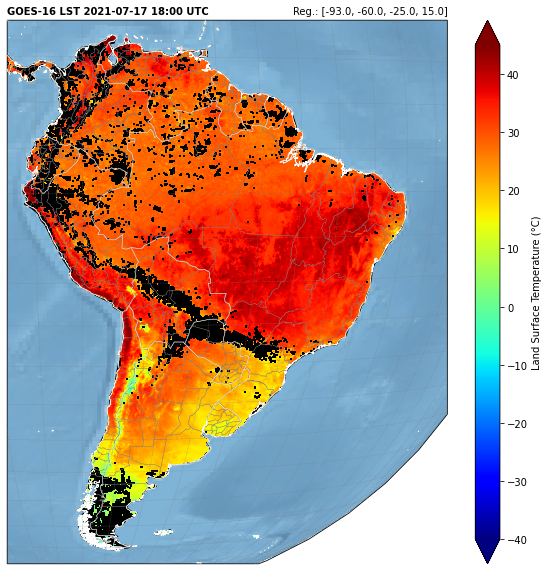

202107181800


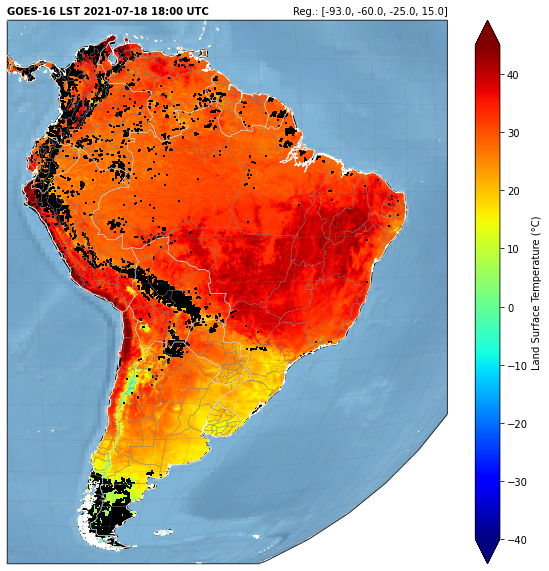

202107191800


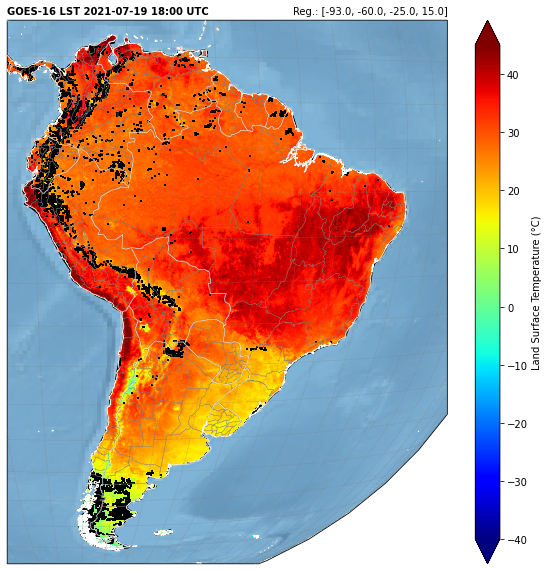

202107201800


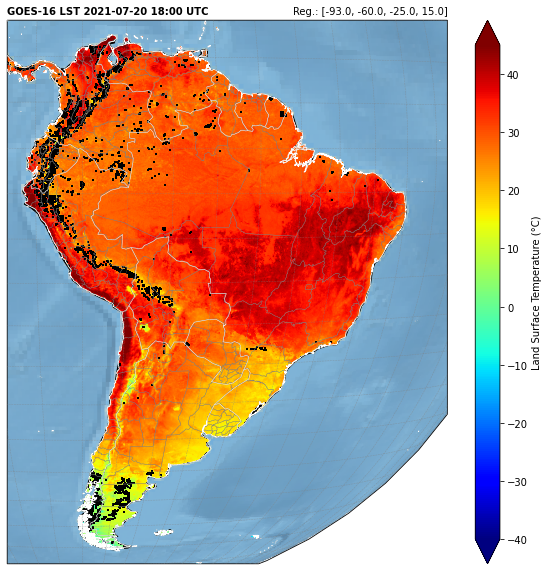

202107211800
No files found for the date: 202107211800, Product-ABI-L2-LSTF
The file is not available, skipping this iteration.
202107221800


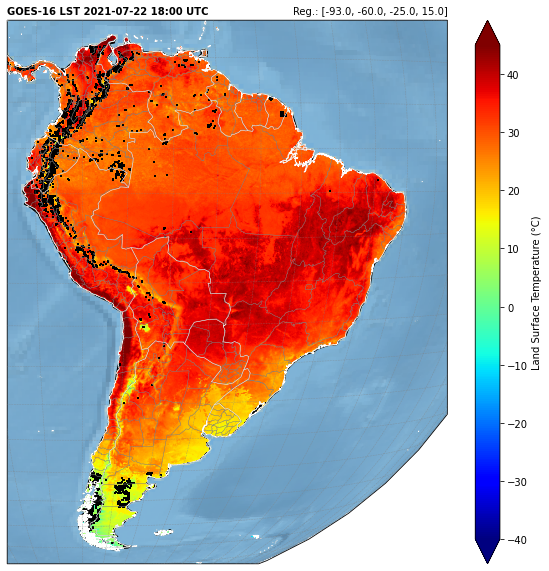

In [ ]:
#-----------------------------------------------------------------------------------------------------------
# Agrometeorology Course - Demonstration 5: Normalized Difference Vegetation Index (NDVI)
# Author: Diego Souza
#-----------------------------------------------------------------------------------------------------------
# Required modules
from netCDF4 import Dataset                    # Read / Write NetCDF4 files
import matplotlib.pyplot as plt                # Plotting library
from datetime import datetime                  # Basic Dates and time types
from datetime import timedelta, date, datetime # Basic Dates and time types
import cartopy, cartopy.crs as ccrs            # Plot maps
import cartopy.io.shapereader as shpreader     # Import shapefiles
import numpy as np                             # Scientific computing with Python
import os                                      # Miscellaneous operating system interfaces
from utilities import download_PROD            # Our own utilities
from utilities import geo2grid, latlon2xy, convertExtent2GOESProjection      # Our own utilities
#-----------------------------------------------------------------------------------------------------------
# Input and output directories
input = "/content/Samples"; os.makedirs(input, exist_ok=True)
output = "/content/Animation"; os.makedirs(output, exist_ok=True)

# Desired extent
extent = [-93.0, -60.00, -25.00, 15.00] # Min lon, Min lat, Max lon, Max lat

# Initial date and time to process
yyyymmddhhmn = '202107151800'
product_name = 'ABI-L2-LSTF'

# Number of days to accumulate
ndays = 7

# Initial time and date
yyyy = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%Y')
mm = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%m')
dd = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%d')
hh = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%H')
mn = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%M')
date_ini = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)))

# Choose number of days ahead
date_end = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)) + timedelta(days=ndays))

#-----------------------------------------------------------------------------------------------------------
# Colormap  
import matplotlib
cmap = 'jet'
vmin = -40.0
vmax = 45.0
#-----------------------------------------------------------------------------------------------------------

# Variable to check if is the first iteration
first = True

while (date_ini <= date_end):

    # Date structure
    yyyymmddhhmn = datetime.strptime(date_ini, '%Y-%m-%d %H:%M:%S').strftime('%Y%m%d%H%M')
    print(yyyymmddhhmn)

    # Download the file 
    file_name_lst = download_PROD(yyyymmddhhmn, product_name, input)
   
    #-----------------------------------------------------------------------------------------------------------
    # If the file hasn't been downloaded for some reason, skip the current iteration
    if not (os.path.exists(f'{input}/{file_name_lst}.nc')):
      # Increment the date_ini
      date_ini = str(datetime.strptime(date_ini, '%Y-%m-%d %H:%M:%S') + timedelta(days=1))
      print("The file is not available, skipping this iteration.")
      continue

    # Open the GOES-R image (LST)
    file = Dataset(f'{input}/{file_name_lst}.nc')
                      
    # Convert lat/lon to grid-coordinates
    lly, llx = geo2grid(extent[1], extent[0], file)
    ury, urx = geo2grid(extent[3], extent[2], file)
            
    # Get the pixel values
    data_lst = file.variables['LST'][ury:lly, llx:urx] - 273.15    
    
    #-----------------------------------------------------------------------------------------------------------
        
    # Compute data-extent in GOES projection-coordinates
    img_extent = convertExtent2GOESProjection(extent)
    
    #-----------------------------------------------------------------------------------------------------------

    # If it's the first iteration, create the array that will store the max values
    if (first == True):
      first = False
      lst_max = np.full((data_lst.shape[0],data_lst.shape[1]),-9999)
  
    # Convert the fill value to nan
    data_lst = data_lst.filled(np.nan)
   
    # Keep the maximuns, ignoring the nans
    lst_max = np.fmax(data_lst,lst_max)
    data = np.ma.masked_where(lst_max == np.nan, lst_max)
    data[data == -9999] = np.nan

    # Choose the plot size (width x height, in inches)
    plt.figure(figsize=(10,10))

    # Use the Geostationary projection in cartopy
    ax = plt.axes(projection=ccrs.Geostationary(central_longitude=-75.0, satellite_height=35786023.0))
  
    # Add a background map
    ax.stock_img()       
    import cartopy.feature as cfeature
    land = ax.add_feature(cfeature.LAND, facecolor='black', zorder=1)

    # Plot the image
    img = ax.imshow(data, origin='upper', vmin=vmin, vmax=vmax, extent=img_extent, cmap=cmap, zorder=2)

    # Add a shapefile
    shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
    ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray',facecolor='none', linewidth=0.3, zorder=3)

    # Add coastlines, borders and gridlines
    ax.coastlines(resolution='10m', color='white', linewidth=0.8, zorder=5)
    ax.add_feature(cartopy.feature.BORDERS, edgecolor='white', linewidth=0.5, zorder=6)
    ax.gridlines(color='gray', alpha=0.5, linestyle='--', linewidth=0.5, xlocs=np.arange(-180, 180, 5), ylocs=np.arange(-90, 90, 5), zorder=7)

    # Add a colorbar
    plt.colorbar(img, label='Land Surface Temperature (°C)', extend='both', orientation='vertical', pad=0.05, fraction=0.05)

    # Extract date
    date = (datetime.strptime(file.time_coverage_start, '%Y-%m-%dT%H:%M:%S.%fZ'))

    # Add a title
    plt.title('GOES-16 LST ' + date.strftime('%Y-%m-%d %H:%M') + ' UTC', fontweight='bold', fontsize=10, loc='left')
    plt.title('Reg.: ' + str(extent) , fontsize=10, loc='right')
    #-----------------------------------------------------------------------------------------------------------
    # Save the image
    plt.savefig(f'{output}/G16_LST_{yyyymmddhhmn}.png', bbox_inches='tight', pad_inches=0, dpi=100)

    # Show the image
    plt.show()

    # Increment the date_ini
    date_ini = str(datetime.strptime(date_ini, '%Y-%m-%d %H:%M:%S') + timedelta(days=1))

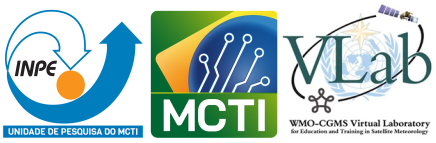